In [1]:
%load_ext tensorboard
import os 
from helpers_image_classification import *
from load_data import *
import cv2
import random
import itertools
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 10000)
from itertools import chain
from collections import Counter
import io
import re
import json
import matplotlib.pyplot as plt
from tqdm import tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
import sklearn.metrics
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
import seaborn as sns
from collections import Counter
from PIL import ImageStat, Image
import shap

Init Plugin
Init Graph Optimizer
Init Kernel


# Extract labeled data

In [7]:
images_path = os.listdir("data/images_resized")
images_path.sort()
images_path = pd.Series(images_path)
listing_ids = images_path.str.extract("(^\d*_\d*)").values
data = open("data/labels_raw.json")
labels_raw = json.load(data)


## Get an overview over the most common words

In [8]:
ids = list(labels_raw.keys())
all_labels_raw = []
for i in ids:
    all_labels_raw += labels_raw[i]
words_raw = pd.Series(all_labels_raw).str.lower().str.split()
all_words_raw = list(chain.from_iterable(list(words_raw.values)))
c = Counter(all_words_raw)
c.most_common(50)


[('inseratsbild', 53173),
 ('the', 6314),
 ('2', 5377),
 ('1', 5332),
 ('3', 4718),
 ('bedroom', 4532),
 ('room', 4409),
 ('and', 4235),
 ('4', 4179),
 ('5', 3972),
 ('with', 3621),
 ('6', 3532),
 ('7', 3156),
 ('kitchen', 2926),
 ('8', 2861),
 ('living', 2680),
 ('9', 2566),
 ('bathroom', 2556),
 ('of', 2515),
 ('10', 2493),
 ('to', 2365),
 ('a', 2305),
 ('bild', 2285),
 ('11', 2081),
 ('in', 1945),
 ('12', 1855),
 ('from', 1768),
 ('13', 1644),
 ('area', 1626),
 ('14', 1472),
 ('view', 1446),
 ('15', 1413),
 ('double', 1402),
 ('is', 1383),
 ('bed', 1352),
 ('-', 1253),
 ('for', 1242),
 ('16', 1179),
 ('garden', 1158),
 ('17', 1085),
 ('dining', 1066),
 ('18', 1017),
 ('19', 947),
 ('20', 907),
 ('shower', 891),
 ('on', 856),
 ('front', 764),
 ('walk', 759),
 ('21', 758),
 ('main', 747)]

Lets get rid of all digits and typical standard non-informative descpriptions

In [9]:
all_words_raw = list(filter(lambda x: x.isalpha(), all_words_raw))
all_words_raw = list(filter(lambda x: x not in ["inseratsbild", "image", "listing", "the", "a", "with", "is", "for", "in", "to", "from", "of", "and", "on", "you"], all_words_raw))

c = Counter(all_words_raw)
c.most_common(50)

[('bedroom', 4532),
 ('room', 4409),
 ('kitchen', 2926),
 ('living', 2680),
 ('bathroom', 2556),
 ('bild', 2285),
 ('area', 1626),
 ('view', 1446),
 ('double', 1402),
 ('bed', 1352),
 ('garden', 1158),
 ('dining', 1066),
 ('shower', 891),
 ('front', 764),
 ('walk', 759),
 ('main', 747),
 ('house', 696),
 ('private', 679),
 ('entrance', 653),
 ('sitting', 646),
 ('large', 623),
 ('master', 615),
 ('your', 613),
 ('balcony', 605),
 ('schlafzimmer', 605),
 ('our', 603),
 ('dublin', 589),
 ('ensuite', 581),
 ('back', 547),
 ('park', 523),
 ('space', 511),
 ('single', 485),
 ('apartment', 463),
 ('at', 461),
 ('gemeinsam', 448),
 ('this', 444),
 ('guest', 439),
 ('tv', 419),
 ('wohnzimmer', 410),
 ('king', 398),
 ('hall', 391),
 ('hallway', 372),
 ('all', 363),
 ('city', 358),
 ('table', 356),
 ('street', 352),
 ('door', 337),
 ('size', 333),
 ('floor', 331),
 ('or', 327)]

We can use some keywords to label the data.
Therefore we construct a loop over all listings which searches for one of the words in the raw labels and loads the corresponding image, saving it with the listing id and its category.

In [10]:
# store labels_raw
l = []
# store path of image
p = []

for id in tqdm(ids):
    labels = labels_raw[id]

    for i, label in enumerate(labels):
        p.append(str(id)+"_"+str(i)+".png")
        l.append(label.lower())

label_df = pd.DataFrame({"img_path":p, "label_raw":l})
# separate id and image number
df = label_df["img_path"].str.split("_", expand = True)
df.columns = ["listing_id", "img_no"]
label_df["id"] = df["listing_id"]

df = df["img_no"].str.split(".", expand = True)
df.columns = ["img_no", "png"]
label_df["img_no"] = df["img_no"]

100%|██████████| 6903/6903 [00:00<00:00, 162821.70it/s]


there are some cases where we couldn't scrape the picture. Let's remove all descriptions where we don't have any picture for.

In [11]:
no_image = list(set(list(p)) - set(images_path))
no_image

['26128805_30.png',
 '29376561_37.png',
 '29377730_36.png',
 '49689495_33.png',
 '49941172_20.png',
 '18632887_6.png',
 '14330376_0.png',
 '14493319_1.png']

In [12]:
filter = np.repeat(False, len(label_df))
for i in no_image:
    filter += label_df["img_path"] == i

In [13]:
label_df = label_df[~filter]


Make a new columns for each category that might be reasonable
- bedroom (including bed)
- kitchen
- living_room
- dining
- bathroom 
- hallway 


- others (including street, city, dublin, dog, cat, people, stop, bus, gym, activities)


Having 7 categories

To make sure we reduce the errors of image labels "views on something from somewhere", like "view on Dublin from bedroom" should be removed from our raw labels

In [14]:
test = label_df["label_raw"]
f = [bool(re.search(r"(view|look) (on|from|to|of) [a-z]* [a-z]* [a-z]*", string)) for string in list(test.values)]
print(np.array(f).sum())
test[np.array(f)]

515


109      view from my secret garden of killiney bay and...
111            view of dalkey from hill of same name . . .
117      a close-up view of the back garden. now can yo...
118      a view of the back garden. can you see the squ...
257             view from outer court into inner courtyard
335                view from hall through to living space 
426      view from sleeping loft - any one for 'blancma...
450      exterior view from corner of park showing typi...
453                           view of house from mountjoy 
500      view of the house and its neighbour, built as ...
502                       view of house from mountjoy park
564                              view from stairs to loft.
597                           view from top of main stairs
600              view of house and its pair, built in 1792
601                view of house from mountjoy square park
717      balcony view: james joyce bridge on the west, ...
721      view from living room - city hall to the left,.

There are more than 400 of those cases. Let's remove these words

In [15]:
label_raw_new = [re.sub(r"((view|look) (on|from|to|of) [a-z]*|(view|look) (on|from|to|of) [a-z]* [a-z]*|(view|look) (on|from|to|of) [a-z]* [a-z]* [a-z]*)", "", string) for string in list(label_df["label_raw"].values)]
label_df["label_raw"] = np.array(label_raw_new)

label_raw_new = [re.sub(r"[0-9]*", "", string) for string in list(label_df["label_raw"].values)]
label_df["label_raw"] = np.array(label_raw_new)

label_raw_new = [re.sub(r"(listing|image)", "", string) for string in list(label_df["label_raw"].values)]
label_df["label_raw"] = np.array(label_raw_new)

label_raw_new = [re.sub(r"window (facing|to) [a-z]* [a-z]*", "", string) for string in list(label_df["label_raw"].values)]
label_df["label_raw"] = np.array(label_raw_new)

label_raw_new = [re.sub(r"(towards|to|facing|with) (bedroom|bath|kitchen|living)", "", string) for string in list(label_df["label_raw"].values)]
label_df["label_raw"] = np.array(label_raw_new)

In [16]:
bedroom = [bool(re.search(r"(bedroom|schlafzimmer|(^| )bed( |$))", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(bedroom)]
label_df["bedroom"] = np.array(bedroom).astype(int)

kitchen = [bool(re.search(r"kitchen", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(kitchen)]
label_df["kitchen"] = np.array(kitchen).astype(int)

dining = [bool(re.search(r"dining", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(dining)]
label_df["dining"] = np.array(dining).astype(int)

living = [bool(re.search(r"(living room|livingroom|wohnzimmer)", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(living)]
label_df["living"] = np.array(living).astype(int)

bathroom = [bool(re.search(r"(bathroom|(^| )bath( |$)|(^| )shower( |$))", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(bathroom)]
label_df["bathroom"] = np.array(bathroom).astype(int)

hallway = [bool(re.search(r"(hallway|(^| )hall( |$)|(^| )corridor( |$))", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(hallway)]
label_df["hallway"] = np.array(hallway).astype(int)

others = [bool(re.search(r"((walk away| mins walk| minutes walk| mins away)|(^| )(garden|park|street|city|dublin|dog|cat|bird|attraction|tram |bus |train |house|exterior|balcony|logo|outside|painting)( |$))", string)) for string in list(label_df["label_raw"].values)]
label_df[np.array(others)]
label_df["others"] = np.array(others).astype(int)

Let's drop every picture which has more than 1 label

In [17]:
label_cols = ["bedroom", "kitchen", "dining", "living", "bathroom", "others","hallway"]
(label_df.filter(label_cols).sum(axis = 1) > 1).sum()

1362

How many image of each category do we have?

In [18]:
label_df.filter(label_cols).sum(axis = 0)

bedroom     6237
kitchen     3269
dining      1199
living      2541
bathroom    3330
others      4367
hallway      811
dtype: int64

So how many images with exactly 1 category do we have?

In [19]:
(label_df.filter(label_cols).sum(axis = 1) == 1).sum()

18961

Use only data with 1 label

In [20]:
filter = label_df.filter(label_cols).sum(axis = 1) == 1

Create a dataframe that we will use to train the model and one to perform predictions. 
Let's save this for later.

In [21]:
train_df = label_df[filter]
unlabeled_df = label_df[~filter]
train_df.head()

,img_path,label_raw,id,img_no,bedroom,kitchen,dining,living,bathroom,hallway,others
1,44077_1.png,our living room,44077,1,0,0,0,1,0,0,0
3,44077_3.png,cosy & comfortable double bedroom with firepl...,44077,3,1,0,0,0,0,0,0
7,44077_7.png,hall,44077,7,0,0,0,0,0,1,0
8,44077_8.png,hall,44077,8,0,0,0,0,0,1,0
13,44077_13.png,luas tram mins walk from our house mins to t...,44077,13,0,0,0,0,0,0,1


0
dining area seats  


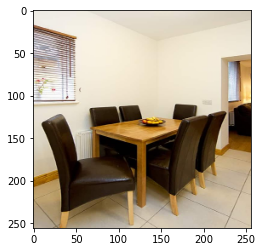

1
dining and living area


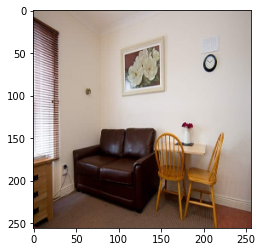

2
dining area


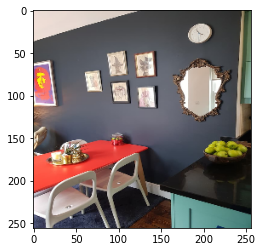

3
..and dining table to seat 


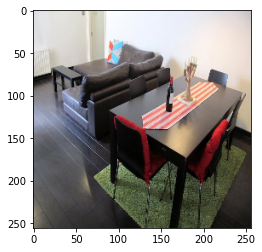

4
living & dining area - beautifully restored with original overmantel, intricate coving and bay window overlooki


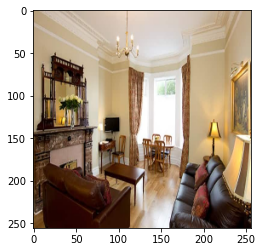

5
living & dining


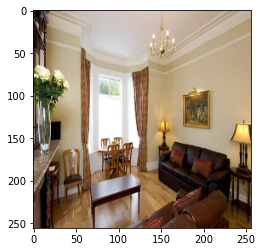

6
bay window with dining table and chairs


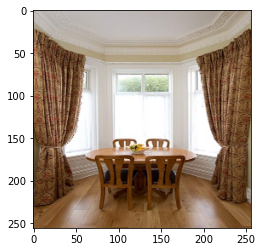

7
view towards dining area and window from entrance



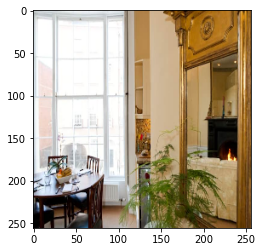

8
dining area overlooked by sleeping loft


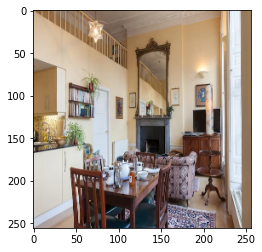

9
study/dining table 


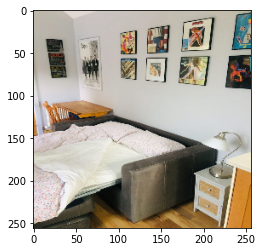

10
 room/dining room


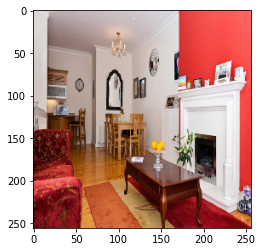

11
solid wood dining room table and six chairs.


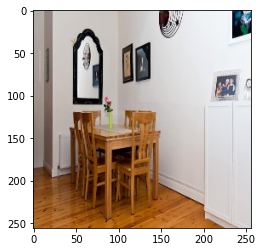

12
dining room


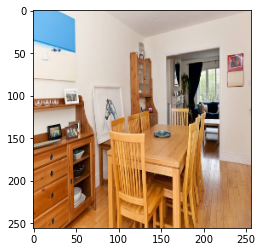

13
dining room


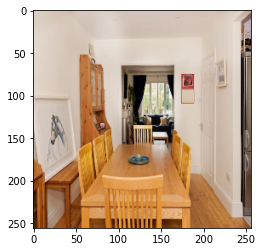

14
outdoor dining/ bbq area


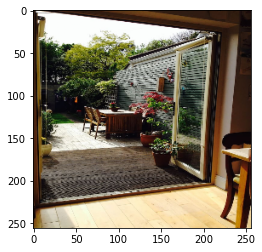

15
dining area


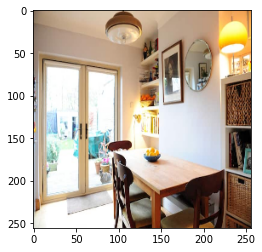

16
dining area


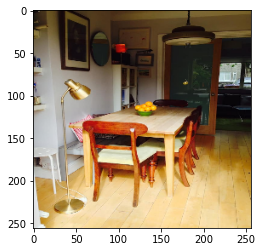

17
dining  area back garden, perfect for bbqs 


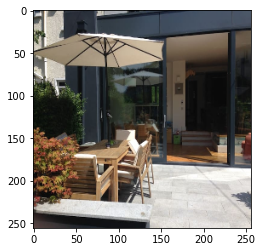

18
dining room table


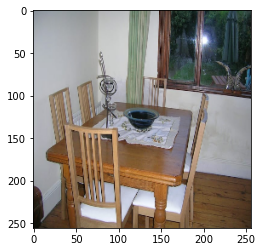

19
dining room


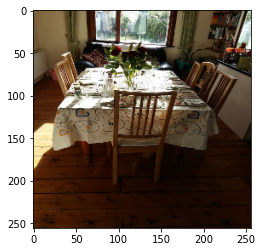

In [22]:
for j, i in enumerate(train_df["img_path"][train_df["dining"]==1][:20]):
    print(j)
    print(train_df["label_raw"][train_df["dining"]==1].values[j])
    img = plt.imread("data/images_resized/"+i)
    plt.imshow(img)
    plt.show()

In [23]:
train_df.set_index('img_path',inplace=True, drop = False)

# turn dummies into string for category
train_df = train_df[train_df[label_cols]==1].stack().reset_index().drop(0,1)
train_df.columns = ["img_path","label"]

# separate id and image number
df = train_df["img_path"].str.split("_", expand = True)
df.columns = ["listing_id", "img_no"]
train_df["id"] = df["listing_id"]

df = df["img_no"].str.split(".", expand = True)
df.columns = ["img_no", "png"]
train_df["img_no"] = df["img_no"]

# store label in one column
le = preprocessing.LabelEncoder()
le.fit(train_df["label"])
train_df['categorical_label'] = le.transform(train_df["label"])

In [24]:
label_book = train_df[["label","categorical_label"]].drop_duplicates().sort_values(by="label")
label_book

,label,categorical_label
23,bathroom,0
1,bedroom,1
78,dining,2
2,hallway,3
21,kitchen,4
0,living,5
4,others,6


# Data

## Creating tf-Datasets

In [23]:
images = []
labels = []
ids = []
for i,p in tqdm(enumerate(train_df["img_path"]), total = len(train_df)):
    img_tmp = cv2.imread("data/images_resized/"+p)
    images.append(img_tmp)
    labels.append(train_df.loc[i,"categorical_label"])
    ids.append(train_df.loc[i,"id"])

100%|██████████| 18961/18961 [01:00<00:00, 313.84it/s]


In [24]:
images = np.stack(images)
labels = np.stack(labels)
ids = np.stack(ids)

In [25]:
np.save("data/images_room.npy", images)
np.save("data/labels_room.npy", labels)
np.save("data/ids_room.npy", ids)

In [26]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.1, random_state=1)
X_train, X_val, y_train, y_val  = train_test_split(X_train, y_train, test_size=0.1, random_state=1) 

In [26]:
batch_size = 32

data_train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
data_train = data_train.cache()
data_train = data_train.shuffle(12000, seed = 123)
train_dataset = data_train.take(len(y_train))
train_dataset = train_dataset.batch(batch_size)

data_test = tf.data.Dataset.from_tensor_slices((X_test, y_test))
data_test = data_test.cache()
test_dataset = data_test.take(len(y_test))
test_dataset = test_dataset.batch(batch_size)

data_val = tf.data.Dataset.from_tensor_slices((X_val, y_val))
data_val = data_val.cache()
val_dataset = data_val.take(len(y_val))
val_dataset = val_dataset.batch(batch_size)

NameError: name 'X_train' is not defined

## Create tfrecord data (for colab)

In [22]:
X_train, X_test, y_train, y_test = train_test_split(train_df["img_path"].values, train_df["categorical_label"].values, test_size=0.1, random_state=1)
X_train, X_val, y_train, y_val  = train_test_split(X_train, y_train, test_size=0.1, random_state=1) 

In [23]:
write_features(X_train, y_train, filename= "data/tfrecord_labeled/train")
write_features(X_test, y_test, filename= "data/tfrecord_labeled/test")
write_features(X_val, y_val, filename= "data/tfrecord_labeled/val")

  0%|          | 0/15357 [00:00<?, ?it/s]2022-02-04 20:42:59.153358: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-02-04 20:42:59.153470: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
  0%|          | 6/15357 [00:00<04:52, 52.55it/s]

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



100%|██████████| 1707/1707 [00:26<00:00, 65.12it/s]


1707

In [14]:
train_dataset = make_dataset("data/tfrecord_labeled/train.tfr", batch_size = 32, training = True)
test_dataset = make_dataset("data/tfrecord_labeled/test.tfr", batch_size = 32)
val_dataset = make_dataset("data/tfrecord_labeled/val.tfr", batch_size = 32)

### Make weights

In [25]:
label_book

,label,categorical_label
23,bathroom,0
1,bedroom,1
78,dining,2
2,hallway,3
21,kitchen,4
0,living,5
4,others,6


In [32]:
y_train = np.concatenate([y for x, y in train_dataset], axis=0)
# compute weights for class imbalance

weights = 1/(pd.Series(y_train).value_counts()/len(y_train))
weights = weights.to_dict()
weights

{1: 3.3435662965382105,
 6: 4.850600126342388,
 0: 6.2023424878836835,
 4: 7.002735978112175,
 5: 8.980701754385965,
 2: 23.883359253499222,
 3: 26.661458333333332}

In [ ]:
# grid search
lrs = [0.001, 0.0001, 0.00001]
l2_reg = [0.01, 0]
dropout = [0,0.2,0.5]

for lr in lrs:
    for l2 in l2_reg:
      for do in dropout:
        logdir = "logs/labeling_cat7/resnet_lr_"+str(lr)+"_l2_"+str(l2)+"_dropout_"+str(do)
        callbacks = []   
        model, history = train_model(train_dataset, val_dataset, epochs = 10, lr = lr, callbacks = callbacks, weights = weights, logdir = logdir, label_book = label_book, l2_reg = l2, do = do)
        # Get the dictionary containing each metric and the loss for each epoch
        history_dict = history.history
        # Save it under the form of a json file
        json.dump(history_dict, open(logdir + "/hist_"+str(lr)+"_l2_"+str(l2)+"_dropout_"+str(do)+".json", 'w'))

A learning rate of 0.00001 performs reasonably well. 
Let's implement early stopping and learning rate scheduling

In [ ]:
# some callbacks:
tf.random.set
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
lr = tf.keras.optimizers.schedules.ExponentialDecay(0.0001, decay_steps=10000, decay_rate=0.9, staircase=False)
logdir = "/content/drive/MyDrive/Dubair/logs/labeling_new/final_model_cat7_0502"
callbacks = [early_stopping]

# model fit
final_model, history = train_model(train_dataset, val_dataset, epochs = 100, lr = lr, callbacks = callbacks, logdir = logdir, weights = weights, label_book = label_book, do = 0.2, l2_reg = 0.01)
final_model.save(logdir)

In [35]:
# extract images and labels to visualize results
y_pred = tf.nn.softmax(final_model.predict(test_dataset))
y_pred_max = tf.argmax(y_pred, axis = 1).numpy()
y_test = np.concatenate([y for x, y in test_dataset], axis=0)
X_test = np.concatenate([x["input_1"] for x, y in test_dataset], axis=0)

show the first 30 predicitions with images

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[3.6101704e-04 9.8307353e-01 3.1079566e-05 4.3137575e-06 4.1302239e-05
 1.6426176e-02 6.2583138e-05], shape=(7,), dtype=float32)


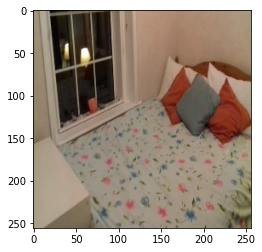

True:  23    bathroom
Name: label, dtype: object
Predicted:  23    bathroom
Name: label, dtype: object
tf.Tensor(
[9.7749102e-01 1.9687392e-02 2.9846555e-05 1.2122755e-03 8.8895072e-04
 1.0751920e-04 5.8300514e-04], shape=(7,), dtype=float32)


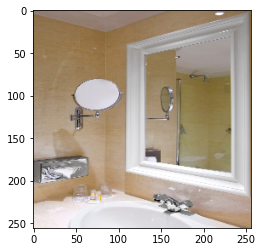

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[1.4441010e-03 9.9049032e-01 7.7976048e-04 1.9295398e-06 1.9126400e-04
 2.3491255e-05 7.0691290e-03], shape=(7,), dtype=float32)


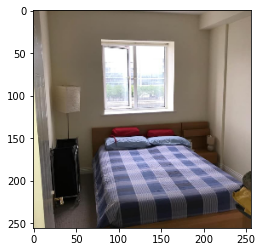

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[4.0353072e-05 5.8887786e-01 8.8890863e-04 2.5334396e-06 3.8526241e-06
 2.9803726e-01 1.1214925e-01], shape=(7,), dtype=float32)


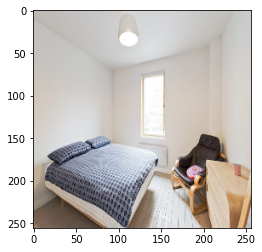

True:  23    bathroom
Name: label, dtype: object
Predicted:  23    bathroom
Name: label, dtype: object
tf.Tensor(
[8.3056724e-01 6.7233324e-02 6.5020181e-04 9.2021015e-05 1.2926405e-03
 6.9107302e-03 9.3253843e-02], shape=(7,), dtype=float32)


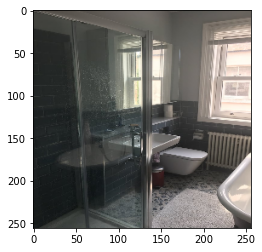

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[3.8949505e-03 9.8197365e-01 1.0406434e-06 1.1750842e-02 1.5676246e-04
 9.3638817e-05 2.1290958e-03], shape=(7,), dtype=float32)


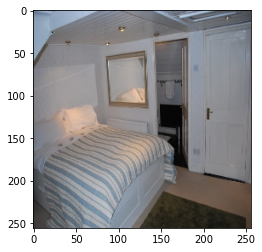

True:  23    bathroom
Name: label, dtype: object
Predicted:  23    bathroom
Name: label, dtype: object
tf.Tensor(
[9.8601979e-01 9.4199423e-03 4.7927249e-05 1.4473003e-03 2.4879649e-03
 1.4693011e-04 4.3012030e-04], shape=(7,), dtype=float32)


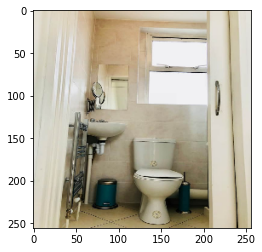

True:  23    bathroom
Name: label, dtype: object
Predicted:  23    bathroom
Name: label, dtype: object
tf.Tensor(
[9.9999797e-01 1.4070849e-06 1.2450386e-12 4.0083410e-07 1.3741464e-10
 4.4195673e-08 1.5592511e-07], shape=(7,), dtype=float32)


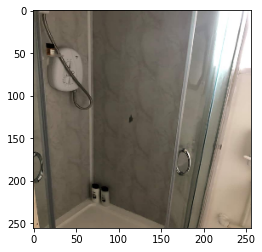

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[3.2396016e-05 9.9291718e-01 2.9247717e-04 5.9247759e-06 5.7423495e-05
 1.9249649e-04 6.5021100e-03], shape=(7,), dtype=float32)


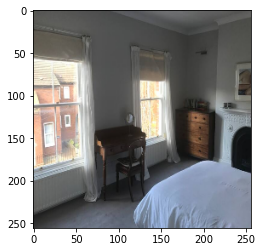

True:  4    others
Name: label, dtype: object
Predicted:  4    others
Name: label, dtype: object
tf.Tensor(
[4.4448498e-06 5.2910482e-06 3.4940766e-07 1.3348630e-07 3.5957466e-08
 1.7299776e-10 9.9998963e-01], shape=(7,), dtype=float32)


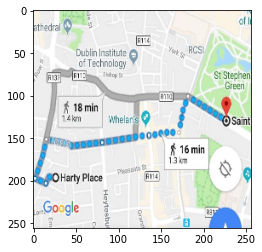

True:  1    bedroom
Name: label, dtype: object
Predicted:  0    living
Name: label, dtype: object
tf.Tensor(
[5.6212027e-02 7.4180596e-02 3.4277680e-04 2.3293981e-02 2.7891610e-02
 8.1449002e-01 3.5889305e-03], shape=(7,), dtype=float32)


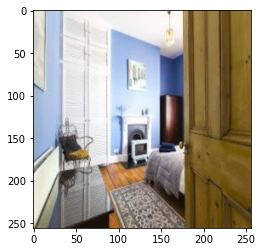

True:  21    kitchen
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[2.2681532e-03 2.5630054e-05 1.4452530e-04 1.6023050e-04 9.9136764e-01
 3.1053659e-03 2.9284961e-03], shape=(7,), dtype=float32)


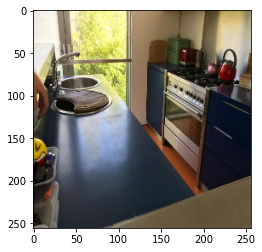

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[8.6175096e-06 9.9378550e-01 9.4164398e-07 5.4747998e-06 6.2537962e-05
 7.2405822e-07 6.1362684e-03], shape=(7,), dtype=float32)


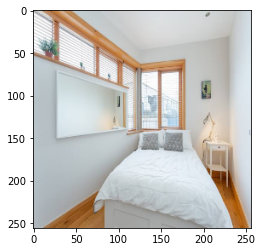

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[2.5284945e-03 9.6238095e-01 5.6123739e-04 1.4936520e-05 3.0494720e-02
 3.9398447e-03 7.9756421e-05], shape=(7,), dtype=float32)


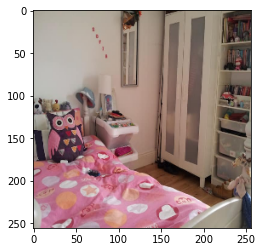

True:  4    others
Name: label, dtype: object
Predicted:  4    others
Name: label, dtype: object
tf.Tensor(
[4.17013780e-06 1.26064653e-04 1.13593195e-07 5.08839378e-07
 2.93498431e-07 4.99405542e-06 9.99863863e-01], shape=(7,), dtype=float32)


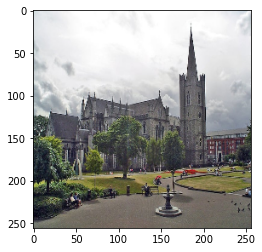

True:  78    dining
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[1.9501714e-04 2.9348393e-03 1.6077161e-01 3.0174890e-01 5.0805235e-01
 2.1162454e-02 5.1347879e-03], shape=(7,), dtype=float32)


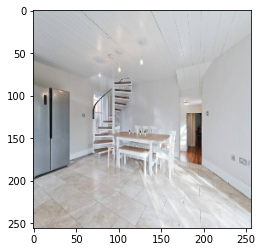

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[1.1324679e-02 9.4526631e-01 6.5304590e-03 1.1842189e-04 3.1057265e-05
 8.8119078e-03 2.7917175e-02], shape=(7,), dtype=float32)


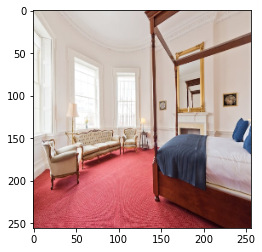

True:  4    others
Name: label, dtype: object
Predicted:  4    others
Name: label, dtype: object
tf.Tensor(
[3.9315339e-05 4.2790687e-03 4.2556078e-04 1.8050987e-04 1.9192649e-04
 1.1073908e-02 9.8380959e-01], shape=(7,), dtype=float32)


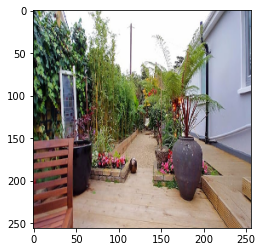

True:  21    kitchen
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[1.3903282e-02 4.3380382e-03 2.2787669e-01 2.8946271e-05 5.3820211e-01
 2.1514982e-01 5.0120876e-04], shape=(7,), dtype=float32)


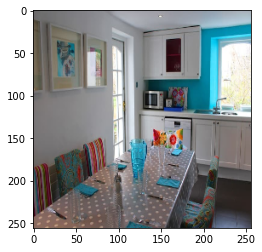

True:  2    hallway
Name: label, dtype: object
Predicted:  2    hallway
Name: label, dtype: object
tf.Tensor(
[1.1035552e-02 4.2657182e-03 1.8182547e-07 9.8444855e-01 3.1329830e-07
 2.2827890e-06 2.4744213e-04], shape=(7,), dtype=float32)


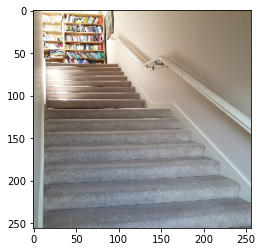

True:  0    living
Name: label, dtype: object
Predicted:  0    living
Name: label, dtype: object
tf.Tensor(
[1.3146848e-04 5.1557687e-03 9.6426829e-04 1.3824004e-02 9.9715008e-04
 9.7824574e-01 6.8155583e-04], shape=(7,), dtype=float32)


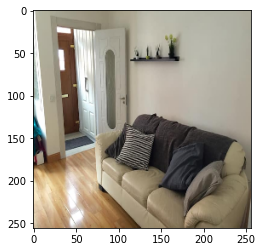

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[8.3174370e-04 9.7145456e-01 5.6682727e-03 1.3461204e-06 1.9995547e-05
 4.3292344e-04 2.1591159e-02], shape=(7,), dtype=float32)


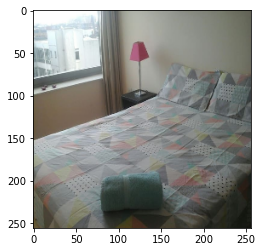

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[4.1218100e-06 9.9998283e-01 6.0478117e-10 8.1578391e-06 9.7481212e-08
 2.3482482e-06 2.4440931e-06], shape=(7,), dtype=float32)


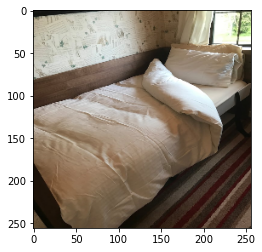

True:  4    others
Name: label, dtype: object
Predicted:  4    others
Name: label, dtype: object
tf.Tensor(
[9.9417662e-07 7.9310196e-04 5.5181412e-05 2.0062081e-04 6.6029542e-04
 3.9786097e-05 9.9825001e-01], shape=(7,), dtype=float32)


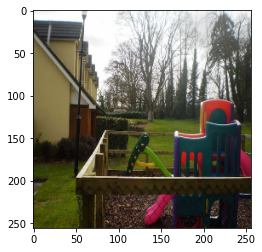

True:  1    bedroom
Name: label, dtype: object
Predicted:  2    hallway
Name: label, dtype: object
tf.Tensor(
[0.00124609 0.10496119 0.01985536 0.64836586 0.00131413 0.22132482
 0.00293258], shape=(7,), dtype=float32)


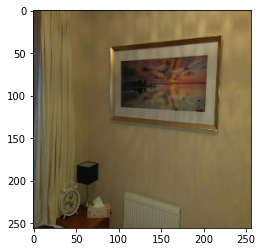

True:  21    kitchen
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[7.0009604e-02 2.8631832e-02 3.9542254e-04 5.2669353e-04 8.8391054e-01
 1.4057751e-02 2.4681680e-03], shape=(7,), dtype=float32)


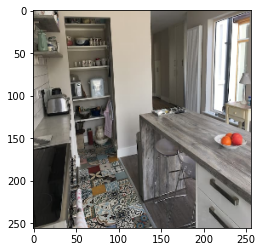

True:  21    kitchen
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[3.5305591e-06 1.4407949e-06 8.5556530e-07 9.7915830e-08 9.9980015e-01
 1.5070707e-04 4.3197459e-05], shape=(7,), dtype=float32)


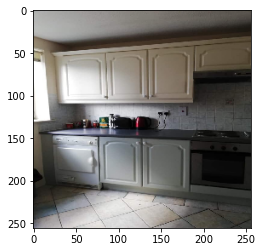

True:  21    kitchen
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[5.6925070e-05 7.2555093e-04 1.0439443e-05 3.6670042e-06 9.9875820e-01
 1.4831749e-04 2.9692869e-04], shape=(7,), dtype=float32)


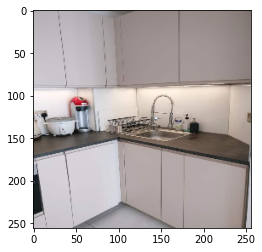

True:  1    bedroom
Name: label, dtype: object
Predicted:  1    bedroom
Name: label, dtype: object
tf.Tensor(
[6.8160528e-03 9.7595721e-01 1.9406445e-05 5.3970834e-05 1.0791390e-02
 1.8794818e-03 4.4824160e-03], shape=(7,), dtype=float32)


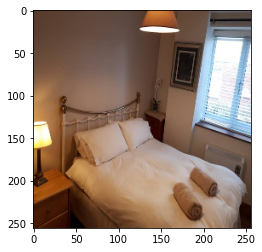

True:  21    kitchen
Name: label, dtype: object
Predicted:  21    kitchen
Name: label, dtype: object
tf.Tensor(
[1.9423240e-08 2.8945126e-06 3.0006579e-08 9.2083772e-09 9.9995685e-01
 1.6822234e-09 4.0285548e-05], shape=(7,), dtype=float32)


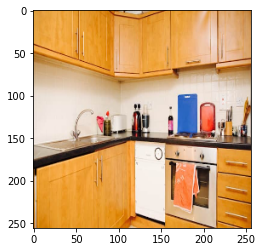

In [36]:
c = 0
for x,test, pred_class, pred in zip(X_test, y_test, y_pred_max, y_pred):
    print("True: ", label_book["label"][label_book["categorical_label"] == test])
    print("Predicted: ", label_book["label"][label_book["categorical_label"] == pred_class])
    print(pred)
    plt.imshow(x)
    plt.show()
    c += 1
    if c == 30:
        break

In [23]:
label_book

,label,categorical_label
21,bathroom,0
1,bedroom,1
2,hallway,2
19,kitchen,3
0,living,4
4,others,5


In [ ]:
c = 0
for x,test, pred_class, pred in zip(X_test, y_test, y_pred_max, y_pred):
    if test == pred_class:
        continue
    
    if test != pred_class:
        #if test == 0:
            print("True: ", label_book["label"][label_book["categorical_label"] == test])
            print("Predicted: ", label_book["label"][label_book["categorical_label"] == pred_class])

            print(pred)
            plt.imshow(x)
            plt.show()
            c += 1
            if c == 20:
                break

# Model Prediction

Model Architecture to load weights

In [2]:
# Define Input
inputs = keras.layers.Input(shape = (None, None, 3), name = "input_1")
x = tf.cast(inputs, tf.float32)
x = keras.applications.resnet50.preprocess_input(x)

# Load ResNet with pretrained Imagenet weights
resnet = keras.applications.resnet.ResNet50(include_top=False, weights='imagenet', pooling="avg")

# freeze the weights
resnet.trainable = False
x = resnet(x)

# Layer 2 - Dense ReLu
x = keras.layers.Flatten()(x)
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Dense(512, activation = "relu", kernel_regularizer = keras.regularizers.l2(0.01))(x)

# Layer 3 - Dense ReLu 
x = keras.layers.Dropout(0.2)(x)
x = keras.layers.BatchNormalization()(x)
outputs = keras.layers.Dense(7)(x)

# Combine pretrained and output model
model = keras.Model(inputs, outputs)

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2022-02-27 09:16:28.064388: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-02-27 09:16:28.064504: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [3]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.1),
                loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=["accuracy"])
model.load_weights("logs/room/final")

2022-02-27 09:16:29.239708: W tensorflow/core/util/tensor_slice_reader.cc:95] Could not open logs/room/final: Failed precondition: logs/room/final; Is a directory: perhaps your file is in a different file format and you need to use a different restore operator?


In [24]:
X = np.concatenate([x["input_1"] for x, y in test_dataset], axis=0)
X = X.astype(float)

2022-02-09 10:21:59.716520: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-02-09 10:21:59.717544: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


## Visualize with SHAP Values

In [44]:
class_names = list(np.ravel(label_book.set_index("categorical_label").values))

def f(x):
    tmp = x.copy()
    preprocess_input(tmp)
    return model(tmp)
# define a masker that is used to mask out partitions of the input image.
masker = shap.maskers.Image("inpaint_telea", X[0].shape)

# create an explainer with model and image masker
explainer = shap.Explainer(f, masker, output_names=class_names)

Partition explainer: 7it [01:32, 15.47s/it]                       


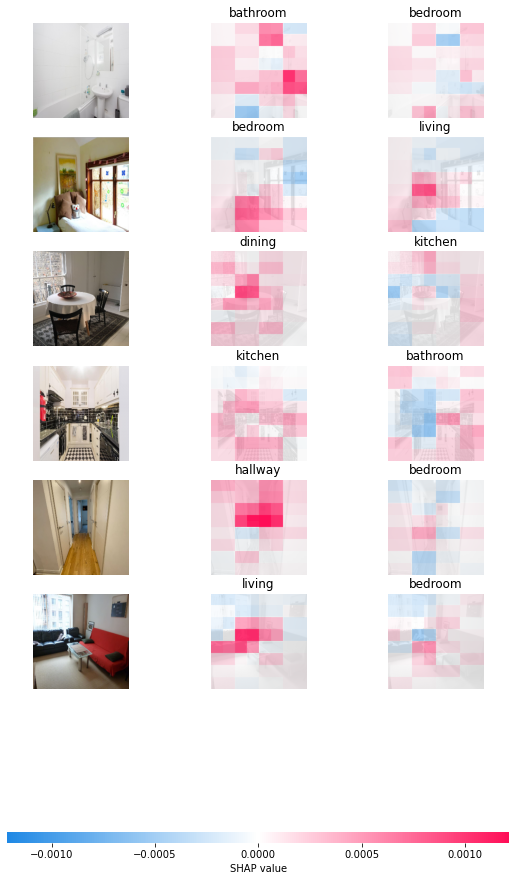

In [47]:
masker = shap.maskers.Image("inpaint_telea", X[0].shape)
# create an explainer with model and image masker
explainer = shap.Explainer(f, masker, output_names=class_names)
# here we explain two images using 500 evaluations of the underlying model to estimate the SHAP values
shap_values = explainer(X[[406,1201,335,1549,1508,1524]], max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:2])
# output with shap values
shap.image_plot(shap_values)

Partition explainer: 51it [15:45, 18.90s/it]                        


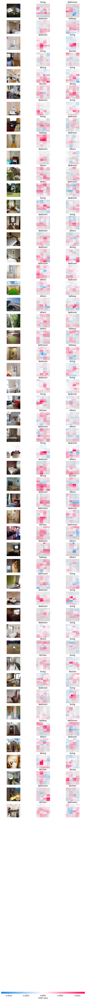

In [45]:
masker = shap.maskers.Image("inpaint_telea", X[0].shape)
# create an explainer with model and image masker
explainer = shap.Explainer(f, masker, output_names=class_names)
# here we explain two images using 500 evaluations of the underlying model to estimate the SHAP values
shap_values = explainer(X[[406,1201,335,1549,1508,1525]], max_evals=500, batch_size=50, outputs=shap.Explanation.argsort.flip[:2])
# output with shap values
shap.image_plot(shap_values)

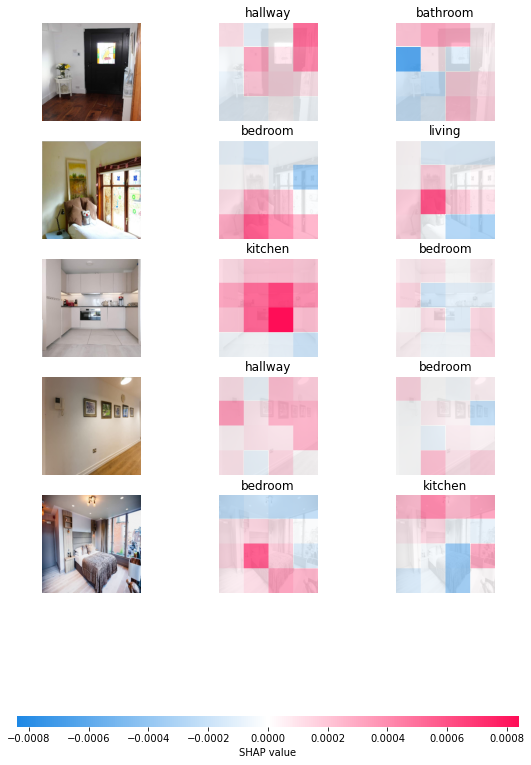

In [47]:
# output with shap values
shap.image_plot(shap_values)

In [48]:
shap_values = explainer(X[400:415], max_evals=100, batch_size=50, outputs=shap.Explanation.argsort.flip[:2])
# output with shap values
shap.image_plot(shap_values)

Partition explainer: 16it [01:13,  5.63s/it]                        


Partition explainer: 6it [00:26,  6.74s/it]                       


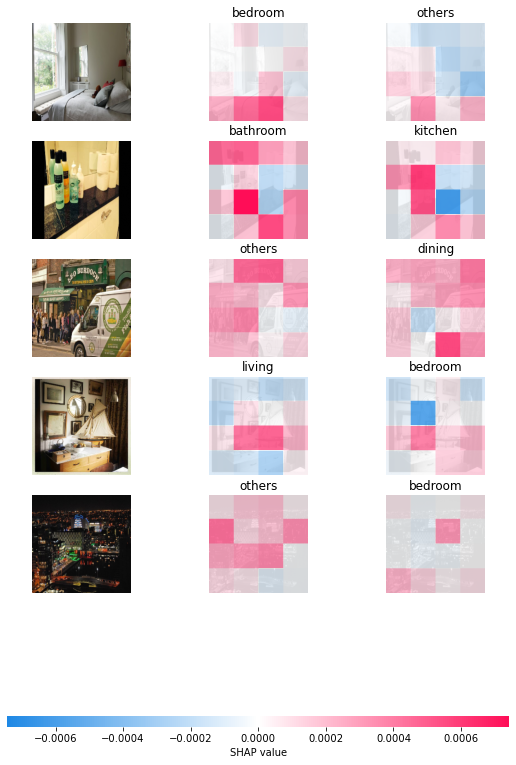

In [50]:
shap_values = explainer(X[100:105], max_evals=100, batch_size=50, outputs=shap.Explanation.argsort.flip[:2])
# output with shap values
shap.image_plot(shap_values)

Partition explainer: 11it [00:50,  6.30s/it]                        


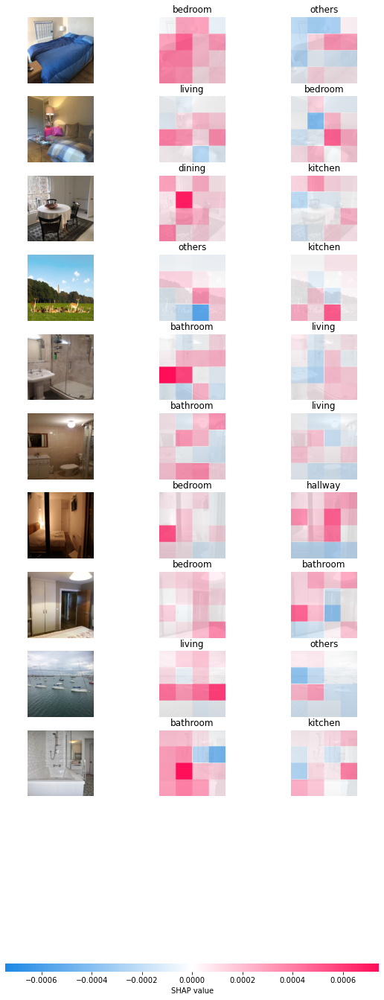

In [54]:
shap_values = explainer(X[333:343], max_evals=100, batch_size=50, outputs=shap.Explanation.argsort.flip[:2])
# output with shap values
shap.image_plot(shap_values)

## Evaluation of test data

In [39]:
model.evaluate(test_dataset)

60/60 [==============================] - 31s 516ms/step - loss: 2.2068 - accuracy: 0.8598


[2.2067930698394775, 0.8597785830497742]

In [29]:
y_pred = np.argmax(model.predict(test_dataset), axis = 1)
y_test = np.concatenate([y for x, y in test_dataset], axis = 0)
X_test =  np.concatenate([x["input_1"] for x, y in test_dataset])


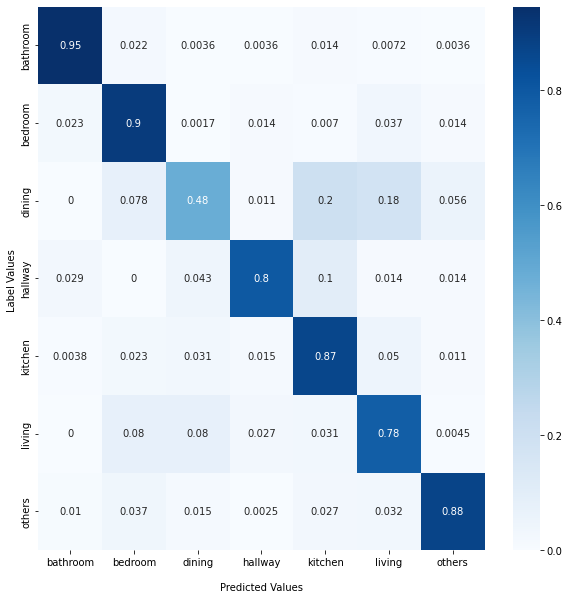

In [43]:


cf_matrix = confusion_matrix(y_test, y_pred)
cf_matrix = cf_matrix.astype('float') / cf_matrix.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10,10)) 
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Label Values ');
ax.xaxis.set_ticklabels(label_book["label"])
ax.yaxis.set_ticklabels(label_book["label"])
plt.show()

### Show some bad examples

In [107]:
def show_false(y_test, X_test, y_pred, idx = [0,1,2,3,4,5]):
    n = len(idx)
    false_class = y_test != y_pred
    print("TOTAL MISCLASSIFIED: ", false_class.sum())
    
    index = np.arange(len(y_test))[false_class]
    X_test_img = X_test[false_class]
    y_test_img = y_test[false_class]
    y_pred_img = y_pred[false_class]

    fig, axes = plt.subplots(int(n/2),2,figsize = (5*2, 5*int(n/2)))
    for i, id in enumerate(idx):
        axes.ravel()[i].set_title("Label: "+ str(label_book["label"][label_book["categorical_label"] == y_test_img[id]].values[0])+" | Predicted Label: "+ str(label_book["label"][label_book["categorical_label"] == y_pred_img[id]].values[0]))
        axes.ravel()[i].imshow(X_test_img[id])
        axes.ravel()[i].set_xlabel("("+chr(i+97)+")")
        plt.setp(axes.ravel()[i].get_xticklabels(), visible=False)
        plt.setp(axes.ravel()[i].get_yticklabels(), visible=False)
        axes.ravel()[i].tick_params(axis='both', which='both', length=0)

TOTAL MISCLASSIFIED:  266


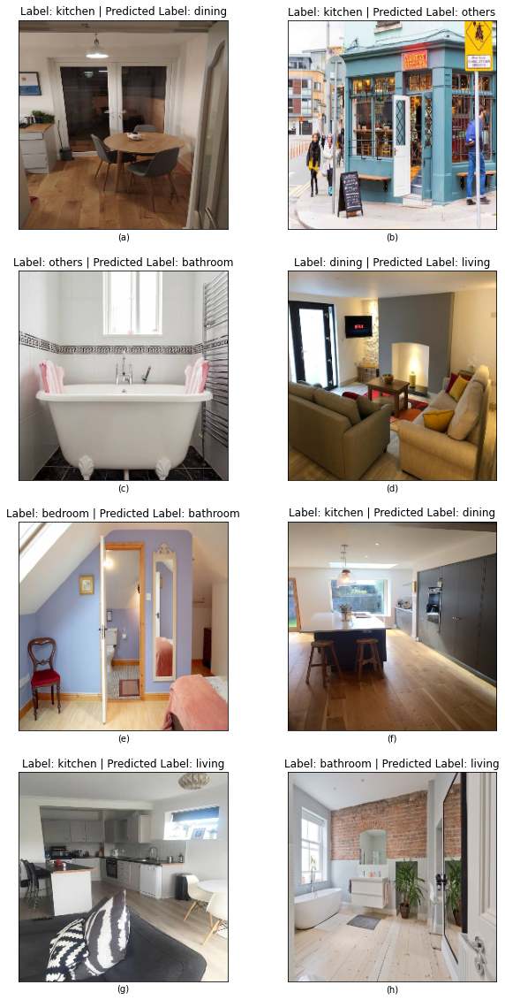

In [112]:
show_false(y_test, X_test, y_pred, idx = [3,10,96,88,79,58,144,83])

TOTAL MISCLASSIFIED:  266


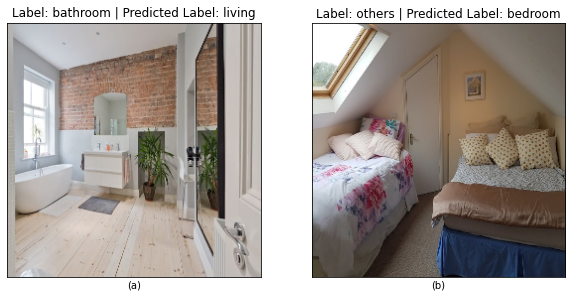

In [110]:
show_false(y_test, X_test, y_pred, idx = [83,84])

TOTAL MISCLASSIFIED:  266


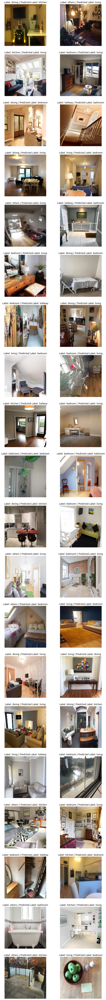

In [83]:
show_false(y_test, X_test, y_pred, idx = range(60,100))

## Prediction on ALL images

In [69]:
# we only need the img_path, id, and img_no
pred_df = label_df[["img_path","id","img_no"]]
pred_df

,img_path,id,img_no
0,44077_0.png,44077,0
1,44077_1.png,44077,1
2,44077_2.png,44077,2
3,44077_3.png,44077,3
4,44077_4.png,44077,4
...,...,...,...
86881,52768367_2.png,52768367,2
86882,52768367_3.png,52768367,3
86883,52768367_4.png,52768367,4
86884,52768367_5.png,52768367,5


We have to write tfrecord files again

Write tfrecords for all images

In [70]:
write_features(pred_df["img_path"], filename= "data/tfrecord_unlabeled/all", prediction = True)

100%|██████████| 86878/86878 [49:59<00:00, 28.96it/s]   


86878

In [71]:
pred_dataset = make_dataset("data/tfrecord_unlabeled/all.tfr", batch_size = 32, prediction = True)

In [72]:
pred_label = np.array([])
pred = []
for x in tqdm(pred_dataset):
    pred_logits = model.predict(x["input_1"], verbose = 0)
    pred_prob = tf.keras.activations.softmax(tf.convert_to_tensor(pred_logits))
    pred.append(pred_prob)
    pred_label = np.append(pred_label, np.argmax(pred_prob, axis = 1))

0it [00:00, ?it/s]2022-02-06 11:42:04.481761: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
5430it [26:46,  3.38it/s]


In [73]:
pred_df["label"] = pred_label


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [74]:
pred_df.head()

,img_path,id,img_no,label
0,44077_0.png,44077,0,4.0
1,44077_1.png,44077,1,5.0
2,44077_2.png,44077,2,1.0
3,44077_3.png,44077,3,1.0
4,44077_4.png,44077,4,1.0


In [38]:
# save for colab
pred_df.to_csv("data/img_paths.csv", index = False)

NameError: name 'pred_df' is not defined

In [77]:
pred_df["catg_label"] = pred_df["label"].replace(list(label_book["categorical_label"]), list(label_book["label"]))


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [78]:
# create dummies for labels to get dummy coding for each images
pred_df = pd.get_dummies(pred_df, columns = ["catg_label"], prefix = "no_img")

In [80]:
# create sum of all images for a category per id
df_labels = pred_df.groupby("id").sum()
df_labels.reset_index(level=0, inplace=True)
df_labels = df_labels.drop("label", axis = 1)

# Create new variables number of images and brightness

In [1]:
df_img = pd.DataFrame({"count": Counter(pred_df["id"])})

NameError: name 'pd' is not defined

In [39]:
# function that computes brightness
def brightness(id, folder = "data/images_resized/"):
   filter = final_df["id"] == id
   id_dir = final_df["img_path"][filter]
   bright = 0
   for id_img in id_dir:
      im = Image.open(folder+id_img).convert('L')
      bright += ImageStat.Stat(im).mean[0]
   return bright/len(id_dir)

In [40]:
# function that computes contrast
def contrast(id, folder = "data/images_resized/"):
    filter = final_df["id"] == id
    id_dir = final_df["img_path"][filter]
    contrast = 0
    for id_img in id_dir:
        img = Image.open(folder+id_img).convert('L')
        min = np.min(img).astype(float)
        max = np.max(img).astype(float)
        # compute contrast
        contrast += (max-min)/(max+min)
    return contrast/len(id_dir)

In [ ]:
df_img.reset_index(level=0, inplace=True)
df_img.columns = ["id", "count"]

In [90]:
brightness_list = []
for i in tqdm(df_img["id"]):
    brightness_list.append(brightness(i))
df_img["brightness"] = brightness_list

100%|██████████| 6183/6183 [03:09<00:00, 32.60it/s]


In [91]:
contrast_list = []
for i in tqdm(df_img["id"]):
   contrast_list.append(contrast(i))
df_img["contrast"] = contrast_list

100%|██████████| 6183/6183 [03:16<00:00, 31.53it/s]


In [92]:
# merge technical things like contrast and brightness with number of images
df_img_info = pd.merge(df_img, df_labels, on = "id")

In [93]:
# save for load_data script
df_img_info.to_csv("data/img_info.csv", index = False)

# MUNICH

In [ ]:
# get images and ids
images = []
ids = []
img_path = []

dir = "munich/images"

# store ids and path
img_paths = os.listdir(dir)

ids_tmp = pd.Series(img_paths).str.split("_", expand = True)[0]
# filter out some stuff thats appears somehow
filter = ~(ids_tmp.values==".")
ids_tmp = ids_tmp[filter]
ids.append(ids_tmp)

img_paths = np.array(img_paths)[filter]
img_path.append(img_paths.tolist())

for i,p in tqdm(enumerate(img_paths), total = len(img_paths)):
    try:
        img_tmp = cv2.imread(dir+"/"+p)
        img_tmp = cv2.resize(img_tmp, dsize=(256, 256))
        images.append(img_tmp)
    except:
        print(p)
        
images = np.stack(images)
ids = np.stack(ids)
img_paths = np.stack(img_paths)


  3%|▎         | 1973/56377 [00:08<03:53, 232.70it/s]

21159888_7.png


 10%|▉         | 5366/56377 [00:23<04:07, 205.86it/s]

48038730_5.png


 10%|▉         | 5565/56377 [00:24<03:53, 217.17it/s]

In [31]:
np.save("munich/images_room_munich.npy", images)
np.save("munich/ids_room_munich.npy", ids)
np.save("munich/img_paths_room_munich.npy", img_paths)

In [5]:
images = np.load("munich/images_room_munich.npy")
ids = np.load("munich/ids_room_munich.npy", allow_pickle=True)
img_paths = np.load("munich/img_paths_room_munich.npy", allow_pickle=True)

In [ ]:
# predict rooms in images
munich_pred = model.predict(images)

In [80]:
df = pd.DataFrame({"id": ids.flatten().tolist(), "img_path": img_paths})
df["label"] = np.argmax(munich_pred, axis = 1)
# save for image model
df.to_csv("munich/img_path.csv")

In [10]:
label_book = pd.DataFrame({"label": ["bathroom", "bedroom", "dining", "hallway", "kitchen", "living", "others"], "categorical_label": np.arange(7)})
label_book

,label,categorical_label
0,bathroom,0
1,bedroom,1
2,dining,2
3,hallway,3
4,kitchen,4
5,living,5
6,others,6


In [52]:
# create categorical labels
df["catg_label"] = df["label"].replace(list(label_book["categorical_label"]), list(label_book["label"]))
# create dummies for labels to get dummy coding for each images
df = pd.get_dummies(df, columns = ["catg_label"], prefix = "no_img")

In [69]:
# create sum of all images for a category per id
df_labels = df.groupby("id").sum()
df_labels.reset_index(level=0, inplace=True)
df_labels = df_labels.drop("label", axis = 1)
df_labels["count"] = np.sum(df_labels.iloc[:,1:], axis = 1)

In [71]:
df_labels.head()

,id,no_img_bathroom,no_img_bedroom,no_img_dining,no_img_hallway,no_img_kitchen,no_img_living,no_img_others,count
0,10010825,6,6,0,0,2,4,4,22
1,10044204,1,6,0,1,3,3,4,18
2,10044722,3,2,0,2,1,1,3,12
3,10066188,2,1,2,2,2,2,10,21
4,10104959,1,0,0,1,0,0,0,2


In [74]:
# compute brightness and contrast
brightness_list = []
for i in tqdm(df_labels["id"]):
    brightness_list.append(brightness(i, folder = "munich/images/"))
df_labels["brightness"] = brightness_list

contrast_list = []
for i in tqdm(df_labels["id"]):
   contrast_list.append(contrast(i, folder = "munich/images/"))
df_labels["contrast"] = contrast_list

100%|██████████| 4369/4369 [05:25<00:00, 13.44it/s]


In [77]:
# save results in csv file
df_labels.to_csv("munich/img_info.csv", index = False)